The purpose of this notebook is to explore convolutions and see their role in the segmentation that we worked on in the segmentation notebook.

Initially done with the scans but the human eye is not great at perceiving radiodensity... so decided to choose a more interpretable image for this exploration -- my sisters new dog :)

In [133]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from nbdev.showdoc import *
from IPython.display import Image
from fastai2.vision.all import *

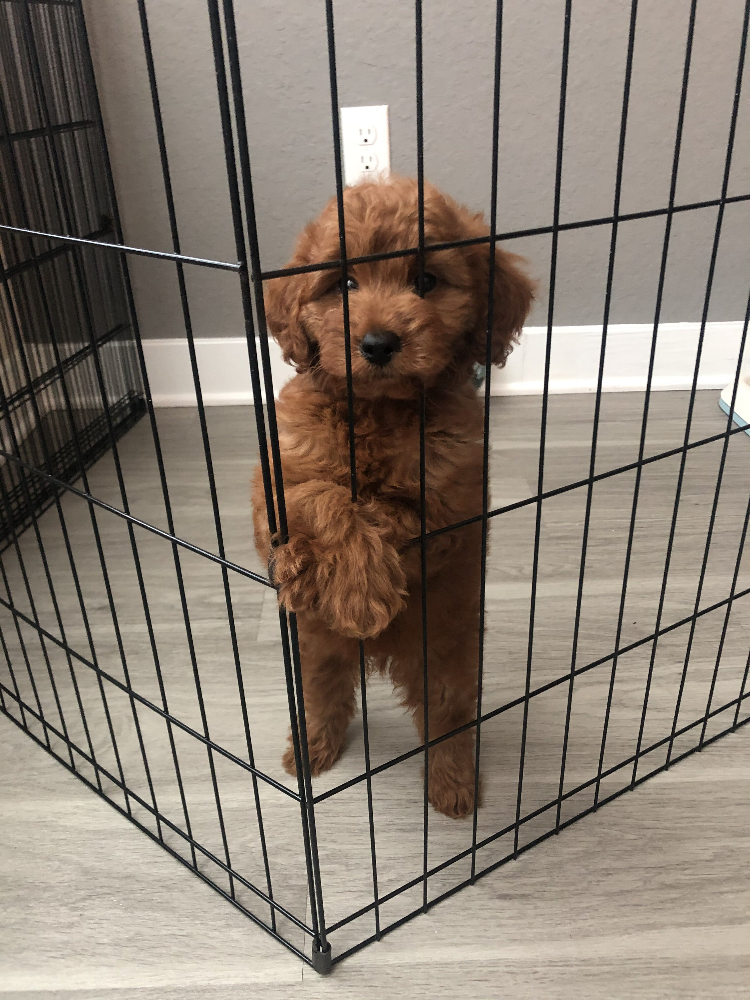

In [137]:
Image.open('kona.jpg')

In [140]:
img = cv.imread('kona.jpg')

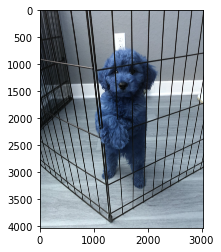

In [148]:
plt.imshow(img);

That's now what we were expecting. This is because openCV returns the image channels BACKWARDS in Blue-Green-Red vs the desired Red-Green-Blue -- the channel axis is at the end. We can convert this last axis manually as shown below

In [162]:
img.shape

(4032, 3024, 3)

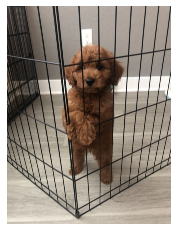

In [163]:
plt.axis('off')
plt.imshow(img[:, :, [2,1,0]]);

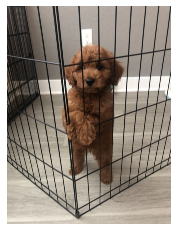

In [166]:
#cv2 has a handy fxn for just this
plt.axis('off')
plt.imshow(cv.cvtColor(img, cv.COLOR_RGB2BGR));

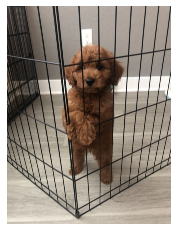

In [169]:
#let's save this as the image pixel information
img = cv.cvtColor(img, cv.COLOR_RGB2BGR)
plt.axis('off')
plt.imshow(img);

We'll try out differnt convolutions to see what information we can glean from each mathematical manipulation

To start we'll take a look at a very simple kernel which is 5 by 5 and each weight is the same

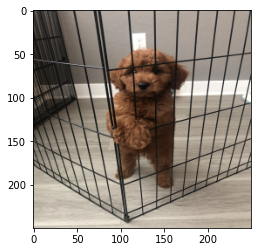

In [186]:
plt.imshow(cv2.resize(img, (250,250), interpolation=cv2.INTER_AREA))

In [182]:
kernel = np.ones((3,3))/9
kernel

array([[0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111]])

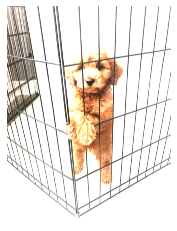

In [183]:
#What will this kernel do?
plt.axis('off')
plt.imshow(cv.filter2D(img, -1, sharp_kernel));

It was supposed to blur the image but since there's so much empty space it just looks washed out. Let's work on resizing the image first

In [95]:
sharp_kernel = [[0.03, 0.13, 0.03],
               [0.13, 3, 0.13],
               [0.03, 0.13, 0.03]]
sharp_kernel = np.array(sharp_kernel, np.float32)

In [96]:
sharp_slices = cv.filter2D(slices, -1, sharp_kernel)

In [107]:
sharp_comp = np.array([sharp_slices[0:2], slices[0:2]], np.float32)

In [111]:
new = slices.copy()
new[2:4] = sharp_slices[2:4]

In [114]:
sharp_slices[2:4].shape

(2, 512, 512)

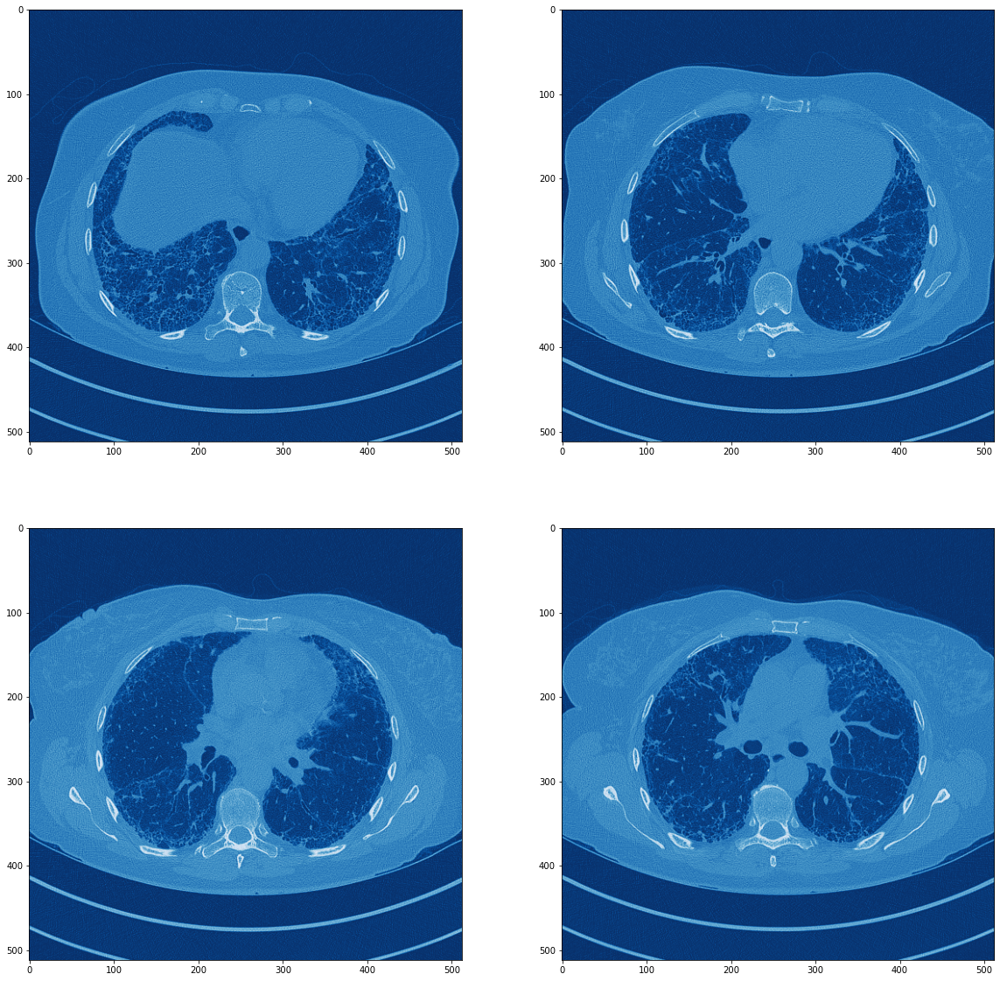

In [112]:
plot_scan(new, 2, 2)